# Imports and file loading

In [1]:
import numpy as np
import cine
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import matplotlib.animation as animation
%matplotlib inline
import imageio
from scipy.ndimage.interpolation import rotate
from math import cos, sin
import time
import random
import string
import optical_imaging as oi
import copy
import oi_file
reload(oi)
reload(oi_file)
from scipy.ndimage.filters import gaussian_filter
import resistive_pulse as rp
import os
pi=3.14159
import cv2
reload(cine)

<module 'cine' from 'cine.pyc'>

In [78]:
file_directory = '/home/preston/Desktop/Science/Research/cancer_cells/data/focusing_test/'
file_name = 'exit.cine'
#file_name = 'entrance.cine'
file_path = file_directory + file_name
vid = cine.Cine(file_path)

# Define template image and stage

- 'first_cell_imaging':
    - c0: 210, 145
    - c1: 207, 129
    - c2: 298, 125
    - c3: 300, 140
    
- 7-4-2016
    - mix_0001
        - c0: 426, 233
        - c1: 426, 217
        - c2: 517, 217
        - c3: 517, 233
        
- 7-10-2016
    - HCT_0000
        - c0:
        - c1:
        - c2:
        - c3:

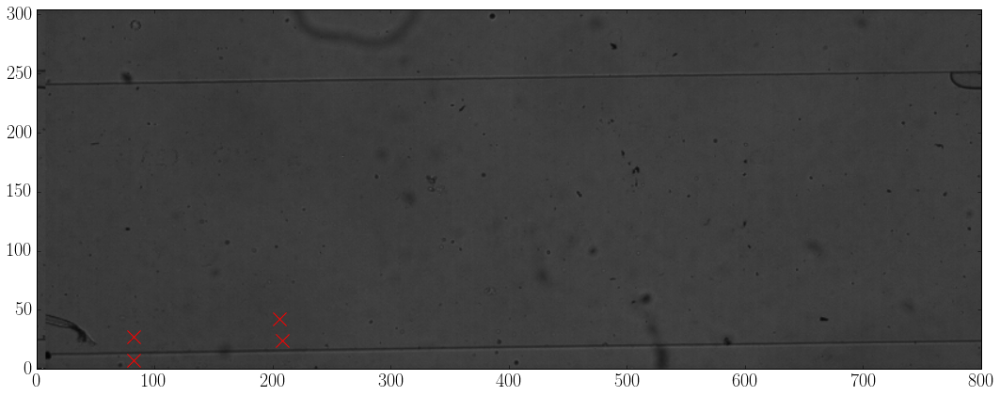

In [79]:
template_frame = vid.get_frame(0)


c0 = np.array([82,7])
c1 = np.array([82,27])
c2 = np.array([208,24])
c3 = np.array([206,42])
c = np.array([c0, c1, c2, c3])
stage = oi.Stage(template_frame, c0, c1, c2, c3)

fig = plt.figure(figsize = (18,12))

plt.imshow(template_frame, cmap = 'gray', vmin = 0, vmax = 1, origin = 'lower')

plt.scatter(c[:,0], c[:,1], marker = 'x', s = 200, c = 'red')

plt.tick_params(labelsize = 20)

plt.xlim(0, vid._image_width)
plt.ylim(0, vid._image_height)

plt.show()

In [80]:
neg_frame = vid.get_frame(100)

In [81]:
sub_frame = neg_frame - template_frame

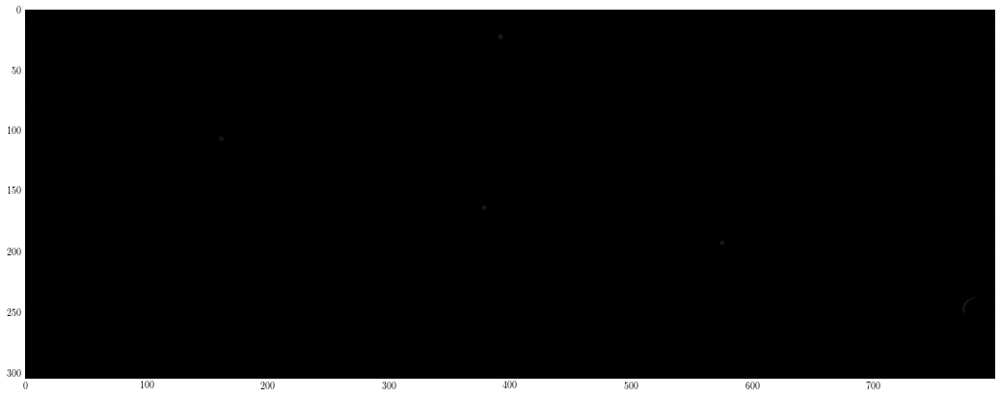

In [82]:
fig = plt.figure(figsize = (18,12))
plt.imshow(sub_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

In [83]:
sub_frame[sub_frame >.02 ] = 1
sub_frame[sub_frame <= .02] = 0

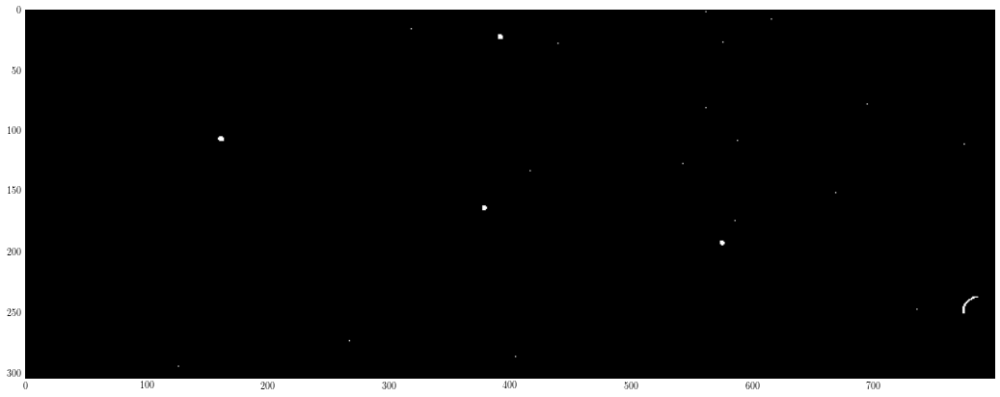

In [84]:
fig = plt.figure(figsize = (18,12))
plt.imshow(sub_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

In [85]:
template_frame[sub_frame == 1] = neg_frame[sub_frame == 1]

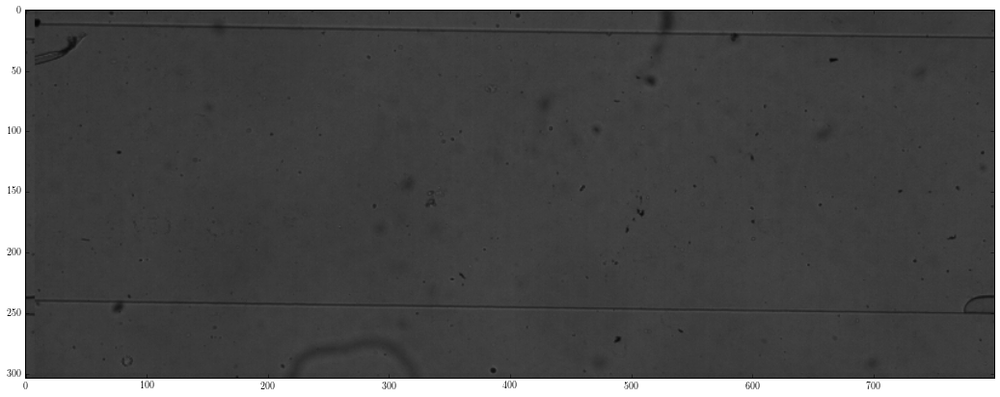

In [86]:
fig = plt.figure(figsize = (18,12))
plt.imshow(template_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

# Optimize alpha, beta

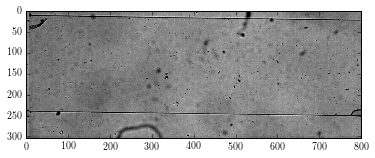

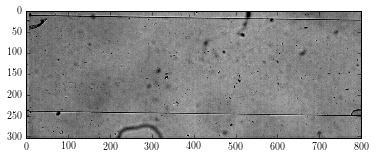

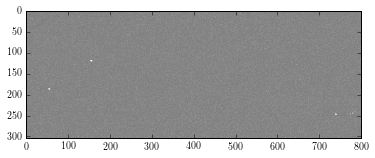

4


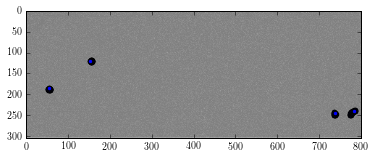

In [87]:
reload(oi_file)
index = 100


frame = vid.get_frame(index)
#template_frame = vid.get_frame(0)


alpha = 6
temp_template_frame= oi_file.change_frame_contrast(template_frame, alpha = alpha)
temp_frame = oi_file.change_frame_contrast(frame, alpha = alpha)

#template_frame = cv2.GaussianBlur(template_frame, (5,5), 0)
#frame = cv2.GaussianBlur(frame, (5,5), 0)

#cutoff = .52

#frame[frame > cutoff] = 1
#frame[frame <= cutoff] = 0

#template_frame[template_frame > cutoff] = 1
#template_frame[template_frame <= cutoff] = 0

threshold_difference = 0.01
cluster_threshold = 10


neg_frame = abs(temp_frame - temp_template_frame)
neg_frame = neg_frame + 0.5

plt.imshow(temp_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()
plt.imshow(temp_template_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()
plt.imshow(neg_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()


clusters = oi.find_clusters_percentage_based(frame, template_frame, threshold_difference = threshold_difference,\
                                             cluster_threshold = cluster_threshold)
plt.imshow(neg_frame, cmap = 'gray', vmin = 0, vmax = 1)
print len(clusters)
for cluster in clusters:
    plt.scatter(cluster[:,1], cluster[:,0])
    pass
plt.xlim(0, neg_frame.shape[1])
plt.ylim(neg_frame.shape[0], 0)
plt.show()

In [71]:
print clusters

[array([[23, 49],
       [23, 50],
       [23, 51],
       [24, 51],
       [25, 51],
       [26, 51],
       [26, 50],
       [26, 49],
       [26, 48],
       [25, 48],
       [25, 49],
       [24, 49],
       [24, 50]]), array([[ 28, 505],
       [ 29, 505],
       [ 30, 505],
       [ 31, 505],
       [ 31, 506],
       [ 31, 507],
       [ 31, 508],
       [ 32, 507],
       [ 32, 506],
       [ 33, 506],
       [ 33, 505],
       [ 31, 504]]), array([[ 44, 365],
       [ 44, 366],
       [ 45, 366],
       [ 46, 366],
       [ 47, 366],
       [ 47, 367],
       [ 48, 366],
       [ 49, 366],
       [ 49, 367],
       [ 49, 368],
       [ 49, 369],
       [ 50, 368],
       [ 50, 366],
       [ 51, 366],
       [ 51, 367],
       [ 52, 366],
       [ 52, 365],
       [ 53, 365],
       [ 53, 364],
       [ 54, 364],
       [ 51, 365],
       [ 51, 364],
       [ 51, 363],
       [ 52, 363],
       [ 52, 362],
       [ 52, 361],
       [ 51, 361],
       [ 51, 362],
       [ 50, 3

In [76]:
ys_entrance = []
for cluster in clusters:
    ys_entrance.append(np.median(cluster[:,0]))

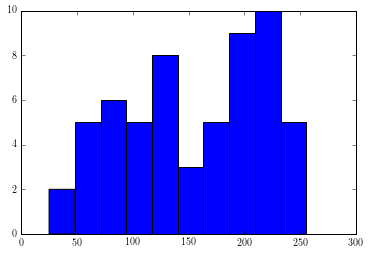

In [77]:
plt.hist(ys_entrance)
plt.show()

26520 clusters:  0


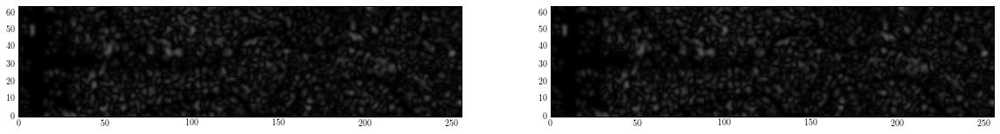

26530 clusters:  0


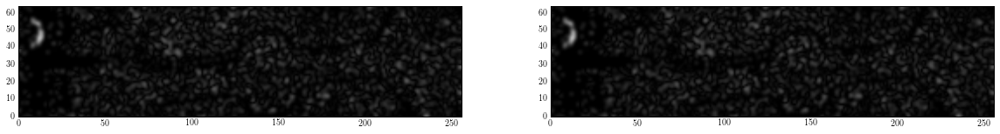

26540 clusters:  1


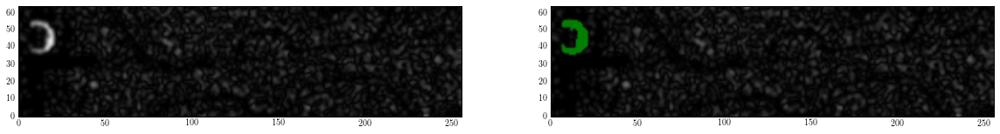

26550 clusters:  1


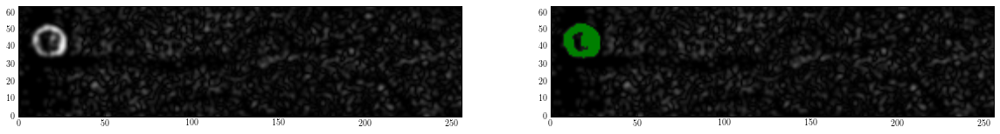

26560 clusters:  1


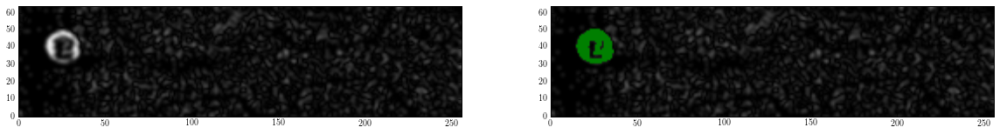

26570 clusters:  1


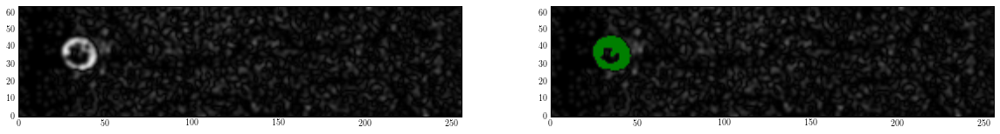

26580 clusters:  1


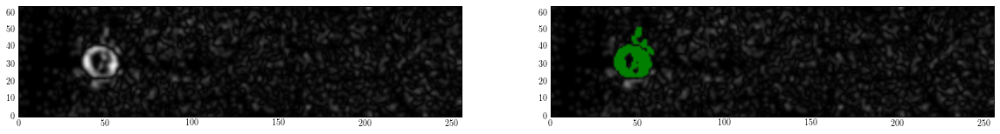

26590 clusters:  1


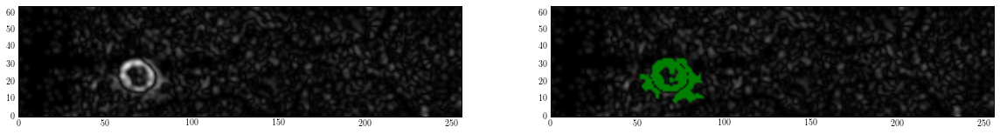

26600 clusters:  1


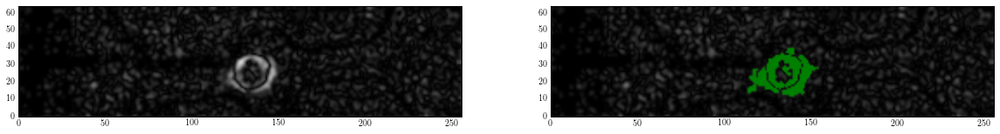

26610 clusters:  1


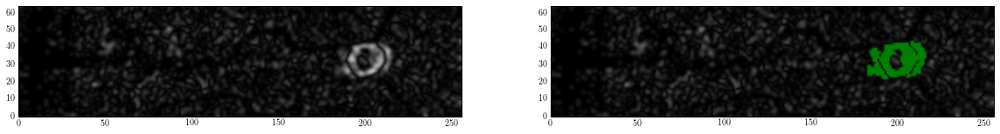

26620 clusters:  2


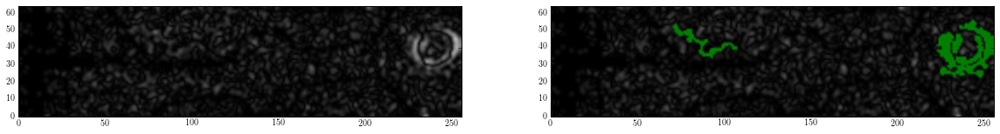

26630 clusters:  2


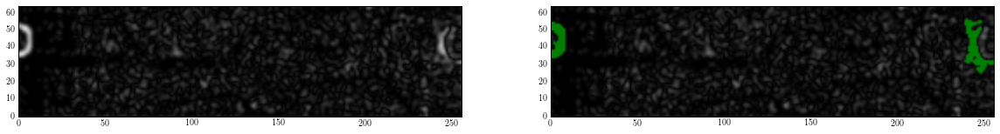

26640 clusters:  1


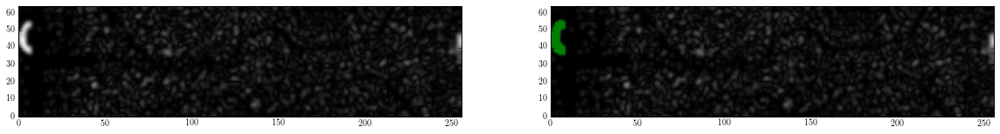

26650 clusters:  0


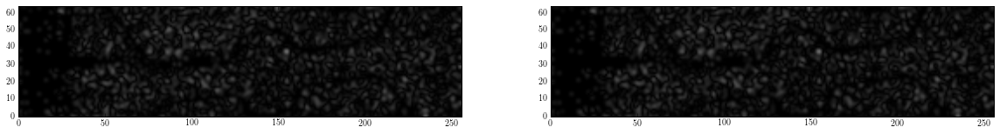

26660 clusters:  0


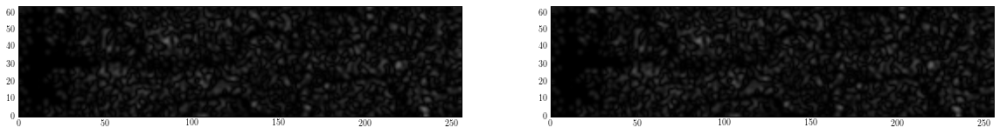

26670 clusters:  0


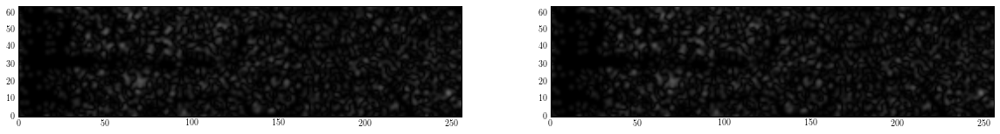

26680 clusters:  0


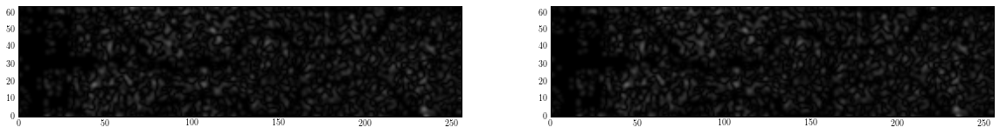

26690 clusters:  0


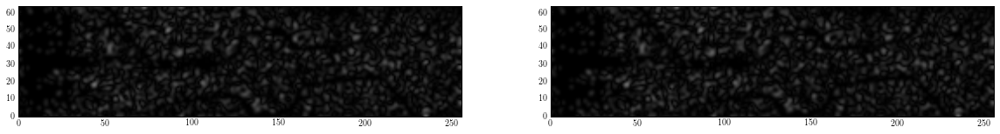

26700 clusters:  0


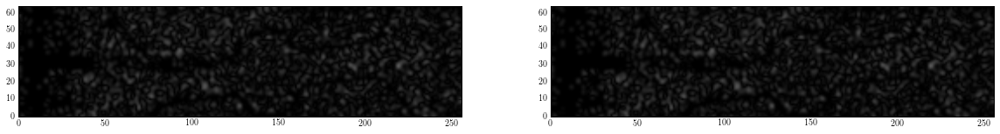

26710 clusters:  0


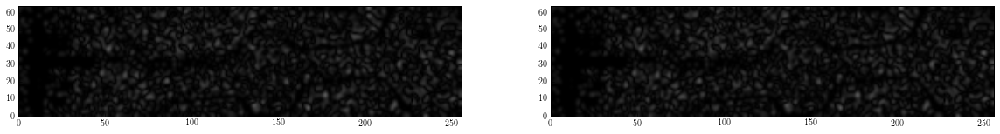

26720 clusters:  0


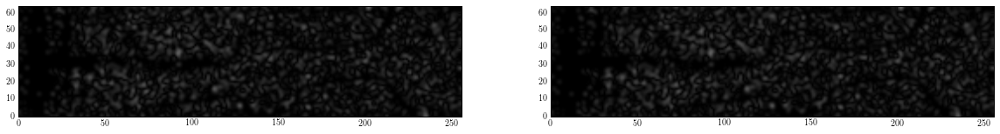

26730 clusters:  0


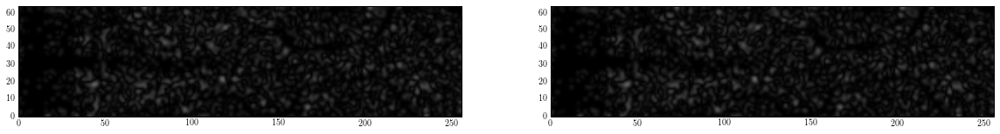

26740 clusters:  0


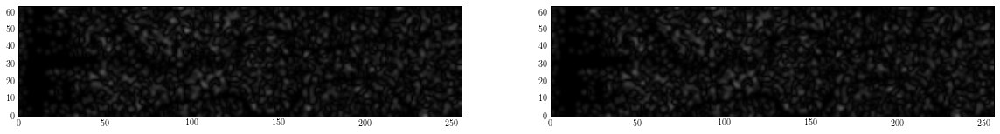

26750 clusters:  0


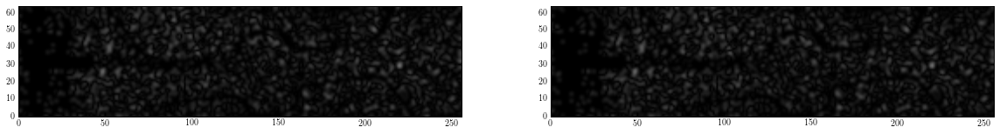

26760 clusters:  0


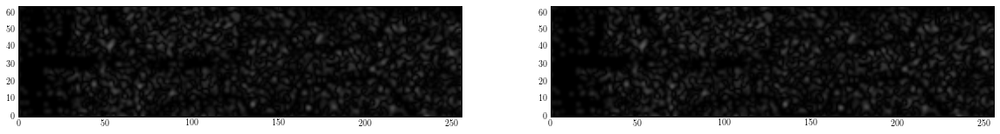

26770 clusters:  0


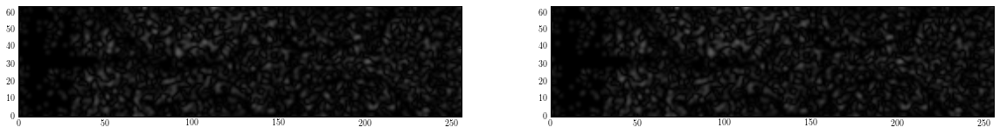

26780 clusters:  0


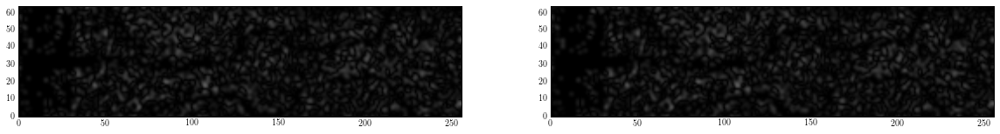

26790 clusters:  1


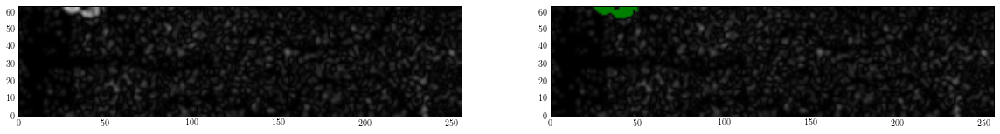

26800 clusters:  1


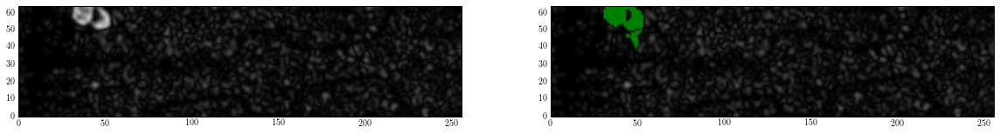

26810 clusters:  1


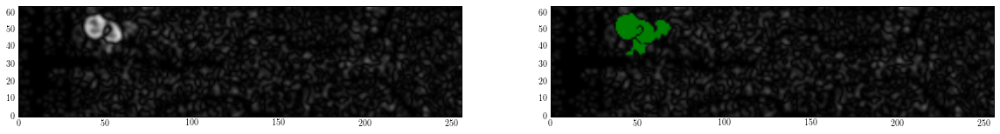

26820 clusters:  1


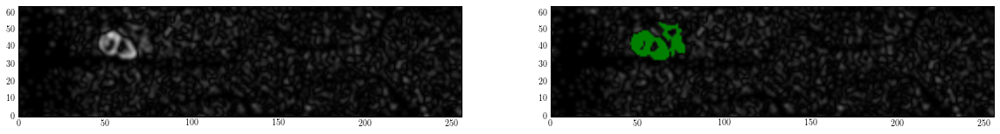

26830 clusters:  2


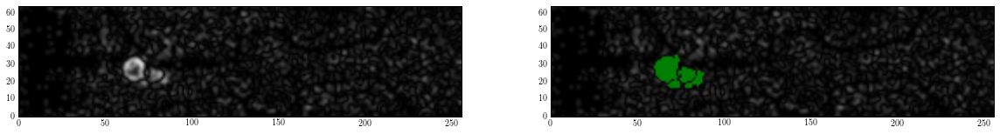

26840 clusters:  1


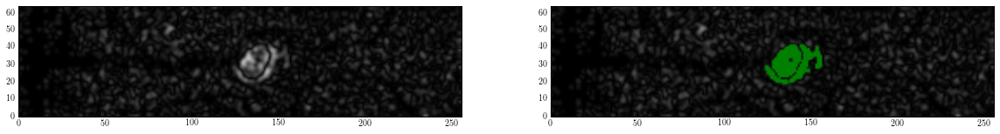

26850 clusters:  1


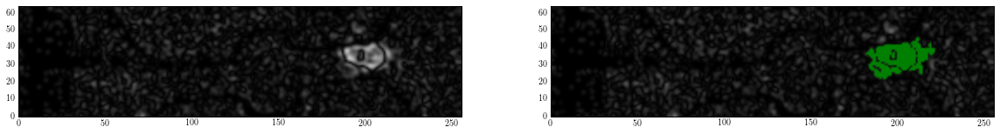

26860 clusters:  3


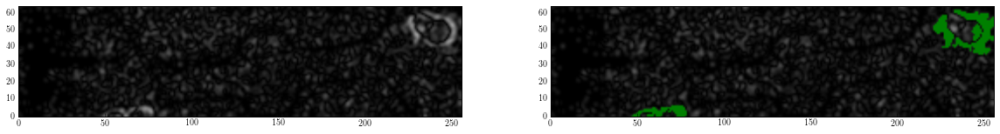

26870 clusters:  2


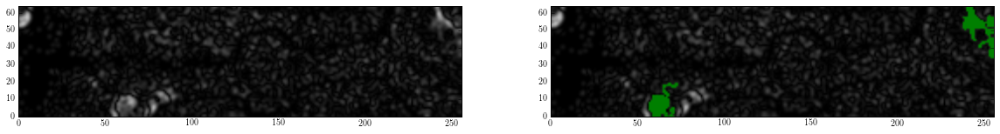

26880 clusters:  2


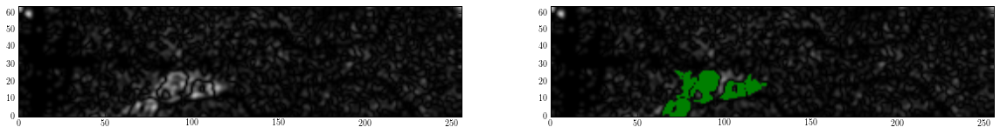

26890 clusters:  3


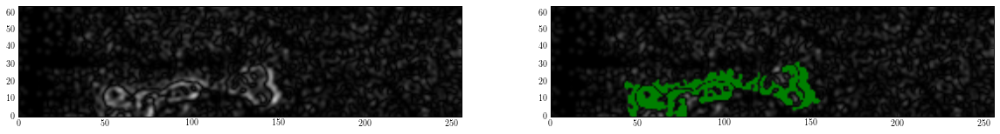

26900 clusters:  5


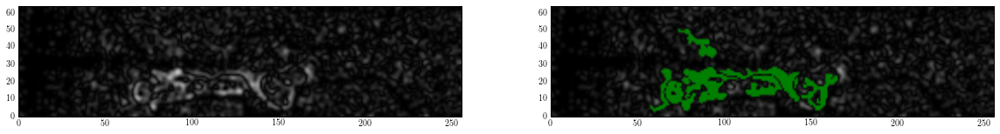

26910 clusters:  6


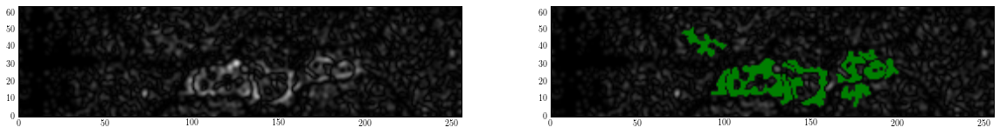

26920 clusters:  6


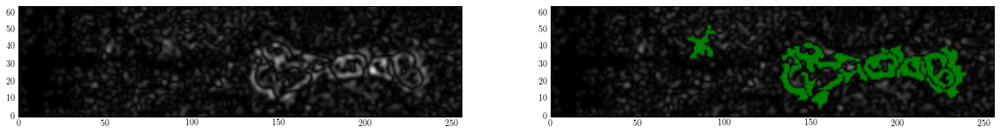

26930 clusters:  1


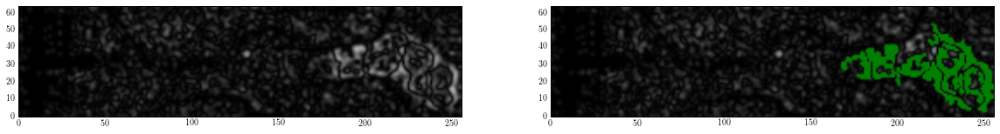

26940 clusters:  4


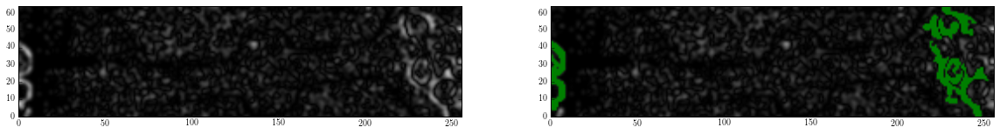

26950 clusters:  2


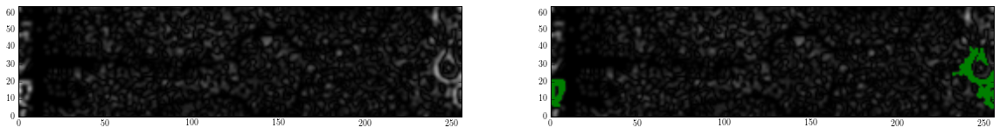

26960 clusters:  0


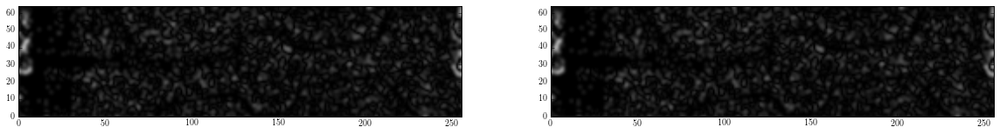

26970 clusters:  0


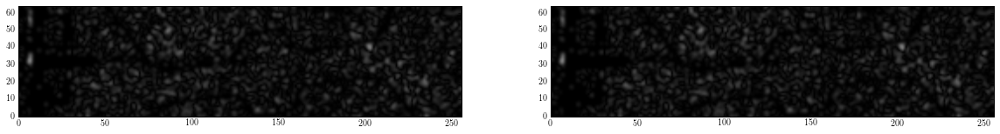

26980 clusters:  1


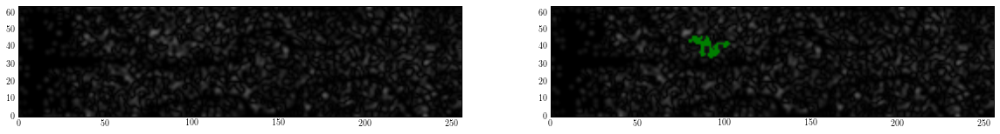

26990 clusters:  0


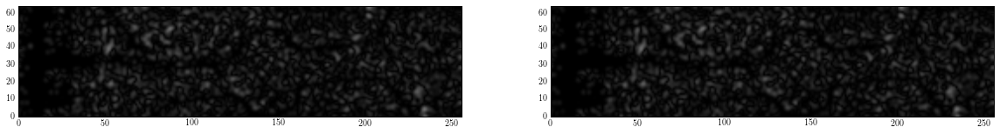

In [5]:
template_frame = vid.get_frame(0)
template_frame = oi_file.change_frame_contrast(template_frame, alpha = alpha)
template_frame = cv2.GaussianBlur(template_frame, (5,5), 0)

for i in range(2652, 2700):
    index = i*10
    
    frame = vid.get_frame(index)
    frame = oi_file.change_frame_contrast(frame, alpha = alpha)
    frame = cv2.GaussianBlur(frame, (5,5), 0)
       

    clusters = oi.find_clusters_percentage_based(frame, template_frame, threshold_difference = threshold_difference,\
                                                 cluster_threshold = cluster_threshold)
    print index, 'clusters: ', len(clusters)
    
    rgb_frame = np.empty((frame.shape[0], frame.shape[1], 3))
    rgb_frame[:,:,:] = abs(template_frame[:,:,np.newaxis]-frame[:,:, np.newaxis])
    
    
    
    
    fig, (ax0, ax1) = plt.subplots(1,2, figsize = (20,10))
    ax0.imshow(abs(template_frame - frame), cmap = 'gray', vmin = 0, vmax = 1)
    ax0.set_xlim(0,rgb_frame.shape[1])
    ax0.set_ylim(0,rgb_frame.shape[0])
    
    
    for cluster in clusters:
        for pix in cluster:
            rgb_frame[pix[0], pix[1], 0] = 0.
            rgb_frame[pix[0], pix[1], 1] = .5
            rgb_frame[pix[0], pix[1], 2] = 0.
    
    
    ax1.imshow(rgb_frame, cmap = 'gray', vmin = 0, vmax = 1)
    ax1.set_xlim(0,rgb_frame.shape[1])
    ax1.set_ylim(0,rgb_frame.shape[0])
    
    plt.show()

# Find events

0.495956420898
(64, 256)


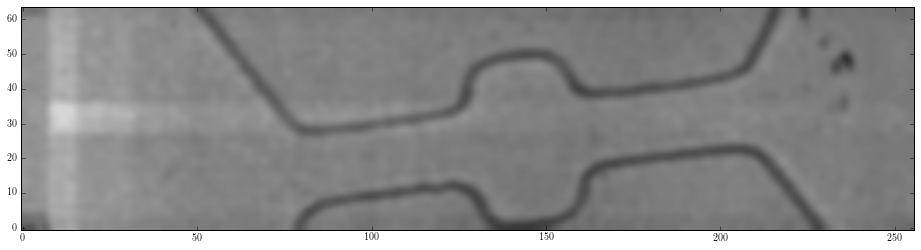

In [10]:
rep_value_0 = .468431
rep_value_1 = .478431
rep_value_2 = .471431
rep_value_3 = .461431
print template_frame[40,120]

print template_frame.shape


#temp_template_frame = copy.copy(template_frame)
#temp_template_frame[310-10:310+10,148-10:148+10] = rep_value_0
#temp_template_frame[270-10:270+10,431-10:431+10] = rep_value_1
#temp_template_frame[281-10:281+10,510-10:510+10] = rep_value_2
#temp_template_frame[158-10:158+10,491-10:491+10] = rep_value_2
#temp_template_frame[70-10:70+10,548-10:548+10] = rep_value_3



fig = plt.figure(figsize = (16,12))
plt.imshow(template_frame,  cmap = 'gray', vmin = 0, vmax = 1, origin = 'lower')
plt.show()

In [88]:
reload(oi)
raw_events=oi.find_events_cine(vid, threshold_difference = threshold_difference, cluster_threshold = cluster_threshold, alpha = alpha, template_frame = template_frame)

KeyboardInterrupt: 

In [10]:
print len(raw_events)

3234


In [11]:
for event in raw_events:
    print len(event._detections)

1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
2
15
16
10
5
4
3
3
6
3
12
6
1
1
1
1
1
1
2
1
1
1
1
1
1
1
1
2
2
1
1
2
1
1
1
1
1
1
1
36
13
2
3
1
25
1
8
1
10
3
6
6
3
7
2
6
1
1
12
18
13
1
1
44
1
23
6
1
1
1
1
1
2
1
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
22
13
1
10
5
3
1
1
2
61
4
1
1
1
28
10
9
8
11
10
2
2
21
15
1
1
2
2
1
1
1
1
1
1
1
1
66
1
1
12
6
9
2
5
1
2
28
17
1
1
1
1
1
1
1
1
1
2
1
1
1
1
1
1
1
30
1
23
7
6
1
1
1
1
1
2
1
1
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
48
14
15
2
10
8
7
4
10
3
3
4
1
19
12
1
1
1
1
1
1
11
2
3
1
1
26
6
1
1
1
1
1
1
1
1
1
3
1
70
4
9
1
1
1
8
1
7
1
1
1
1
1
1
1
1
10
1
14
1
2
1
1
1
1
1
1
1
1
4
8
6
4
1
38
1
13
1
31
3
3
8
7
4
1
1
22
1
9
5
1
3
9
1
6
2
1
36
16
1
1
1
1
1
1
1
1
1
1
1
1
1
1
3
52
1
29
16
11
1
1
1
47
1
25
7
1
1
1
1
2
3
3
1
5
68
12
7
13
2
4
22
13
1
1
2
1
1
1
1
1
1
1
1
1
1
1
1
1
55
1
13
15
2
18
15
1
1
45
5
1
1
6
1
1
2
1
1
1
1
1
1
1
1
1
1
2
1
2
1
1
1
1
1
1
19
2
22
6
2
1
1
1
1
1
27
5
5
1
4
2
1
1
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
53
9
5
1
1
25
1
35
10
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
1
1
1
1
8
20
3
6
12

##### Save events

In [ ]:
reload(oi_file)

In [ ]:
oi_file.save_oi_events_json('/home/preston/Desktop/Science/Research/cancer_cells/data/10-5-2016/events/\
10um_ps_0_10000fps_events',\
                       raw_events)

In [12]:
events = copy.deepcopy(raw_events)

##### Load events

In [ ]:
reload(oi_file)
reload(oi)

In [ ]:
events = oi_file.load_oi_events_json('/home/preston/Desktop/Science/Research/cancer_cells/data/10-5-2016/events/\
10um_ps_0_10000fps_events')

print len(events)

### Event post-processing

##### Connect loose

In [18]:
print len(events)
events = oi.connect_loose_events(copy.deepcopy(events), tf_sep_threshold = 5, dist_threshold = 10)
print len(events)

644
638


##### Remove events that don't enter, exit channel

In [14]:
for i, event in enumerate(events):
    event.get_channel_enter_exit_tf(stage)
    
print len(events)
events = [event for event in events if (event._channel_enter_tf != None) and (event._channel_exit_tf != None)]
print len(events)

3234
50


# Create trajectory plot

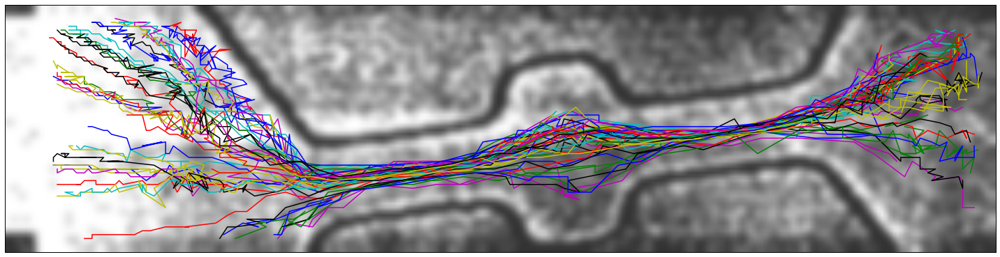

In [15]:
fig = plt.figure(figsize = (20,12))

#colors = cm.rainbow()

#gs = gs.GridSpec(2, 2)

for i, event in enumerate(events[:]):
    px = []
    py = []
    for detection in event._detections:
        px.append(detection._px)
        py.append(detection._py)
    plt.plot(px, py, lw = 1.5)

plt.imshow(template_frame, alpha=0.8, cmap = 'gray', origin = 'lower')
plt.xticks([])
plt.yticks([])

fig.tight_layout()

#plt.savefig('/home/preston/Desktop/Science/Research/cancer_cells/10-5-2016_10um_0_10000fps.png', dpi = 300)

plt.show()

In [ ]:
file_directory_bvi = '/home/preston/Desktop/Science/Research/cancer_cells/data/8-18-2016/oi_rp/bvi/'
file_directory_gallery = file_directory_bvi.split('bvi')[0] + 'events/oi_gallery/'
if not os.path.exists(file_directory_gallery):
    os.makedirs(file_directory_gallery)
    
gallery_base_name = '/home/preston/Desktop/Science/Research/cancer_cells/data/8-18-2016/oi_rp/bvi/HCT-116_pr0005_0000.bvi'
gallery_base_name = gallery_base_name.split('bvi')[-2].replace('/', '').replace('.','')+'_'

In [ ]:
def create_event_gallery(event_num):
    px_list = []
    py_list = []
    
    directory = file_directory_bvi.split('/')[0]+'/'
    
    for i, det in enumerate(events[event_num]._detections[:1]):
        px_list.append(det._px)
        py_list.append(det._py)
        fig = plt.figure(figsize = ((12,6)))
        plt.imshow(oi_file.get_frame_bvi(file_path_bvi, det._tf, 256, 512), alpha=0.5, cmap = 'gray', origin = 'lower')
        
        plt.plot(px_list, py_list)
        
        plt.savefig(file_directory_gallery + gallery_base_name + str(event_num) + '-' + str(i) + '.png' )

# Find particle edges

In [179]:
template_index = 0
event_index = 4

indices = [det._tf for det in events[event_index]._detections]

template_frame = vid.get_frame(0)
template_frame = oi_file.change_frame_contrast(template_frame, alpha = alpha)
template_frame = cv2.GaussianBlur(template_frame, (5,5), 0)

frames = [vid.get_frame(index) for index in indices]
frames = [oi_file.change_frame_contrast(frame, alpha = alpha) for frame in frames]
frames = [cv2.GaussianBlur(frame, (5,5), 0) for frame in frames]

neg_frames = [abs(frame - template_frame) for frame in frames]

clusters = [det._pixels for det in events[event_index]._detections]

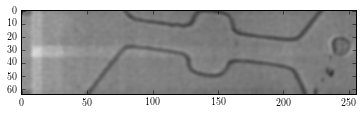

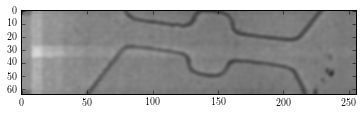

In [149]:
plt.imshow(frames[30], cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

plt.imshow(template_frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

# Canny method
- image preprocessing
- convolve image with Sobel kernels to find gradients; gradient direction is rounded to one of four angles
- non-maximum suppression: (thinning the edges)
- Hysteresis thresholding: check to see if maximum gradient in a detected edge exceeds a max value, or falls below a min value

In [150]:
print np.max(frame_temp)
print np.min(frame_temp)

0.586538791656
0.310354709625


0
0 10 58 83


/home/preston/anaconda3/envs/py27/lib/python2.7/site-packages/ipykernel/__main__.py:27: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


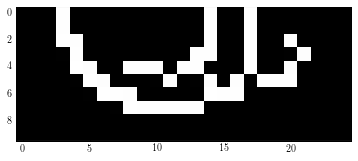

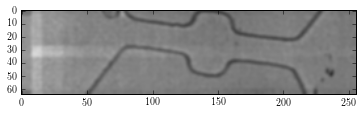

1
0 13 56 87


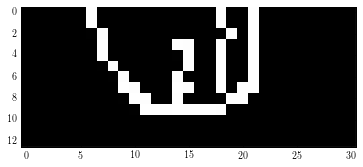

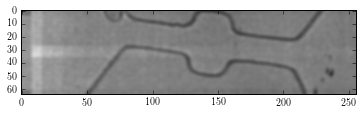

2
0 17 58 88


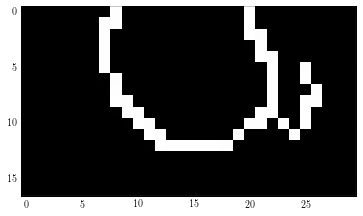

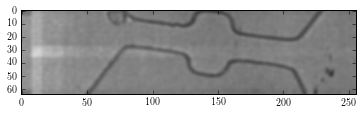

3
0 20 62 90


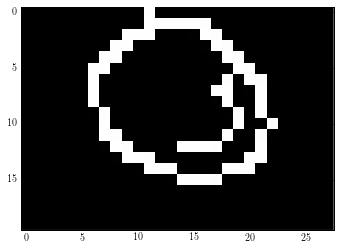

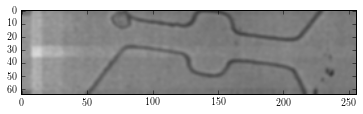

4
0 25 67 96


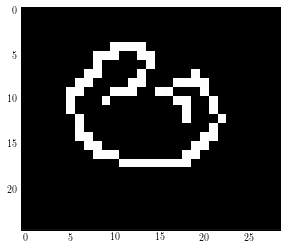

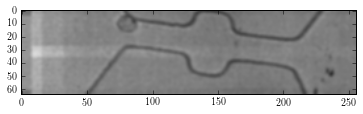

5
0 25 68 104


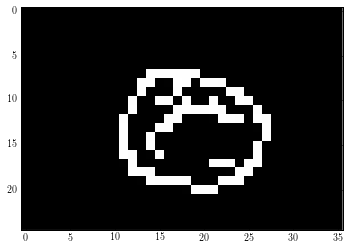

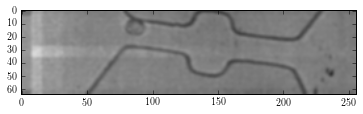

6
0 28 78 113


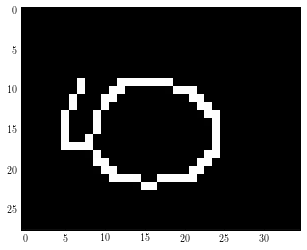

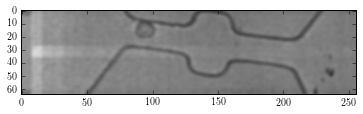

7
0 28 88 120


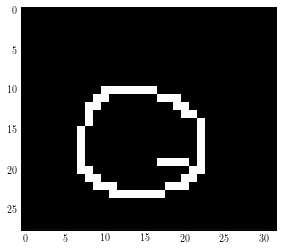

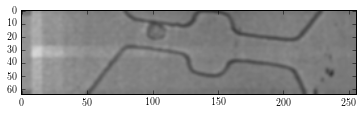

8
5 34 94 125


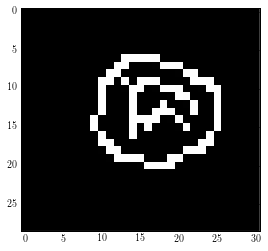

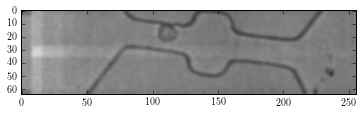

9
5 32 102 135


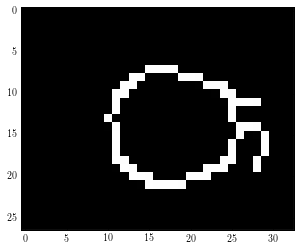

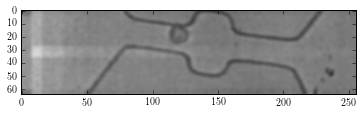

10
8 32 109 147


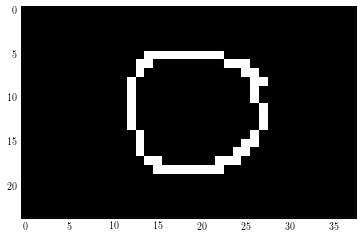

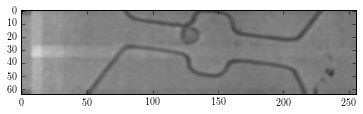

11
8 31 121 150


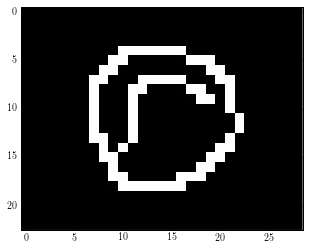

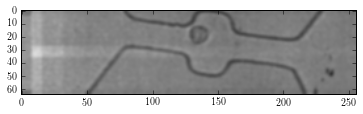

12
4 30 126 155


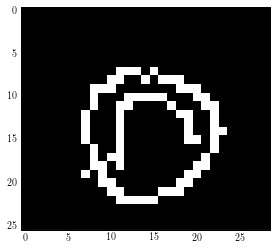

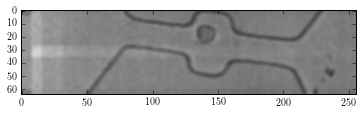

13
3 30 129 160


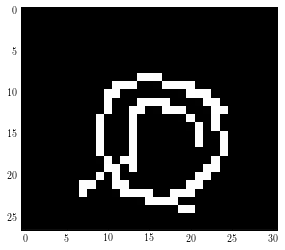

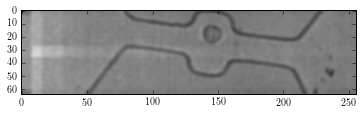

14
2 33 133 168


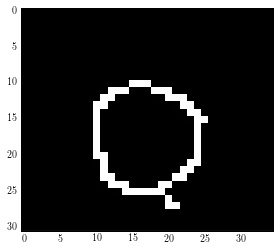

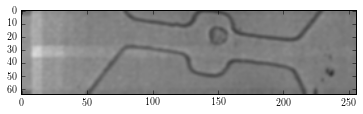

15
8 37 139 173


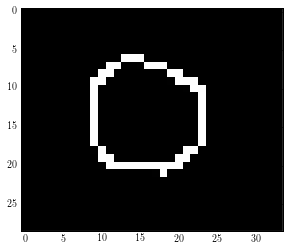

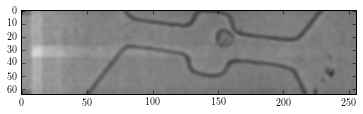

16
11 36 146 176


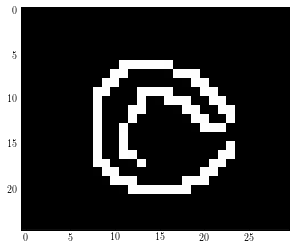

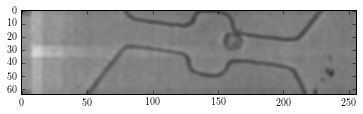

17
12 38 153 187


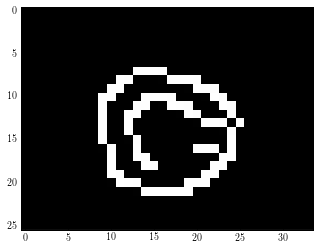

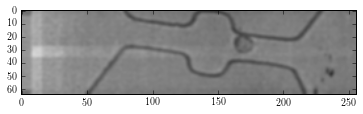

18
12 44 163 195


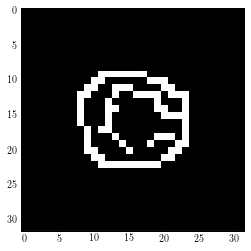

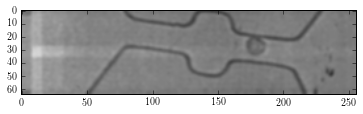

19
16 42 170 207


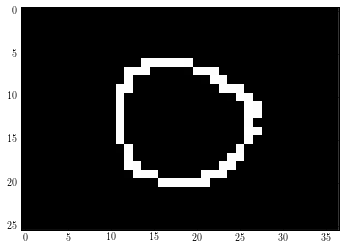

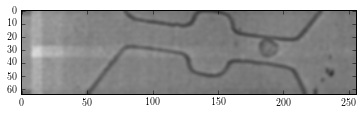

20
16 44 180 212


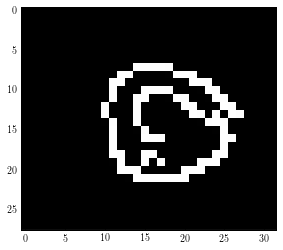

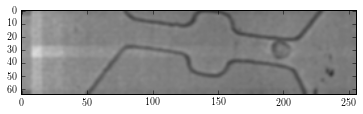

21
17 42 191 223


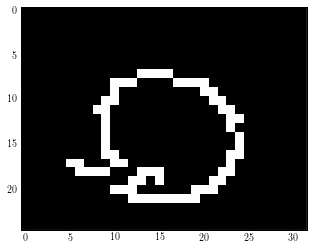

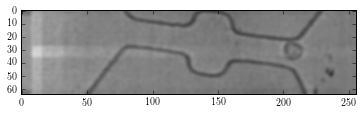

22
19 46 196 233


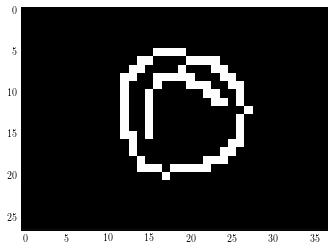

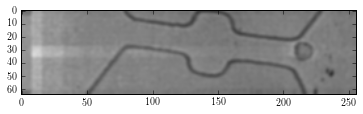

23
18 46 205 238


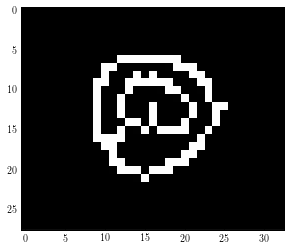

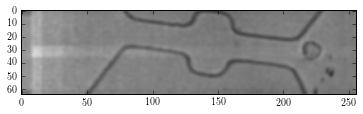

24
17 42 210 242


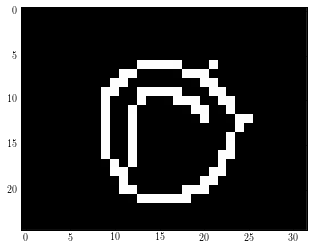

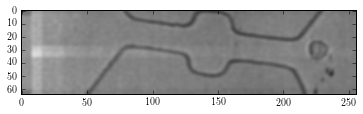

25
18 41 214 245


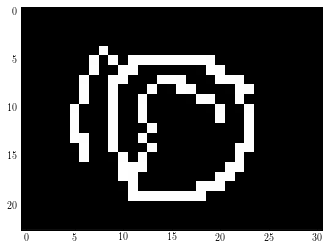

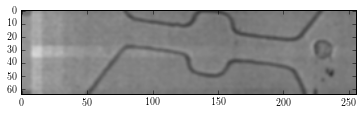

26
16 41 216 254


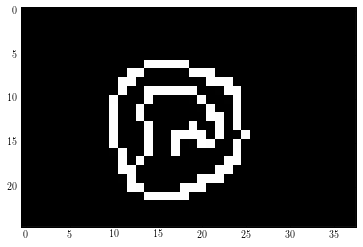

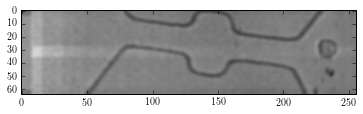

27
15 43 220 254


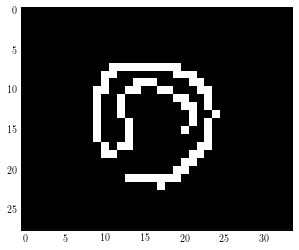

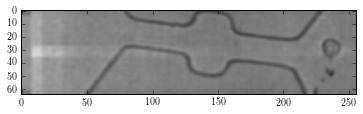

28
16 41 222 254


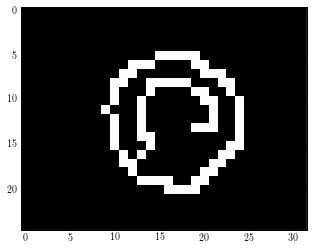

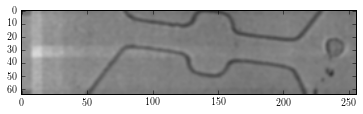

29
16 44 225 257


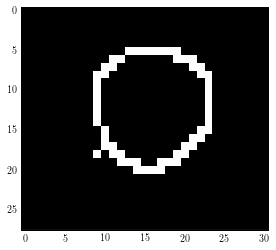

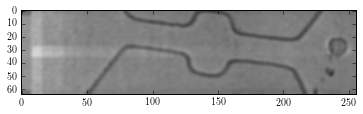

30
15 42 228 258


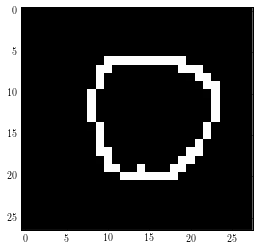

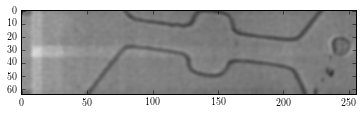

31
10 42 232 258


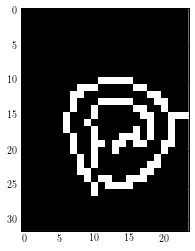

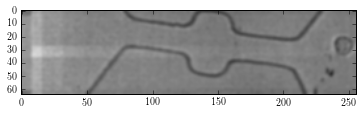

32
13 40 233 258


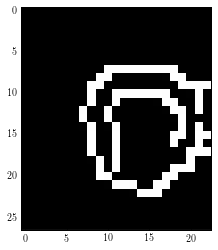

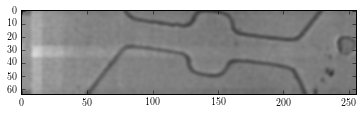

33
13 42 235 258


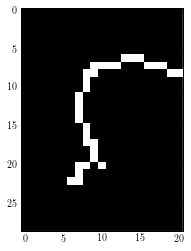

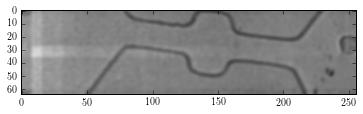

34
9 40 235 258


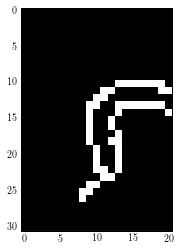

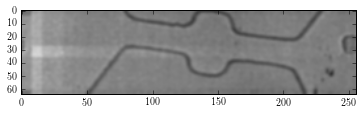

35
12 41 236 258


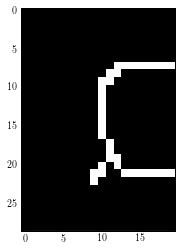

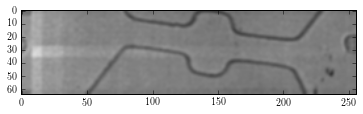

36
13 39 242 258


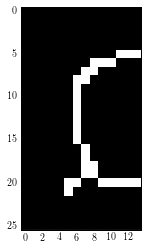

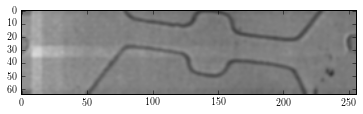

37
13 38 238 258


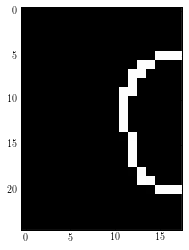

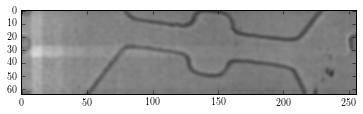

38
13 37 243 258


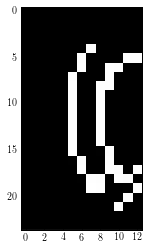

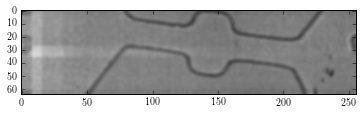

39
13 36 245 258


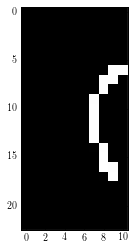

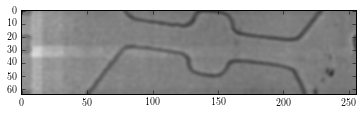

In [173]:
delta = 3

for i, frame in enumerate(frames):
    #frame_temp = cv2.GaussianBlur(frames[i] - template_frame, (5,5), 0)
    print i
    frame_temp = (frames[i] - template_frame) + .5
    
    row0 = clusters[i][:,0].min() - delta
    row1 = clusters[i][:,0].max() + delta
    
    col0 = clusters[i][:,1].min() - delta
    col1 = clusters[i][:,1].max() + delta
    
    if row0 < 0:
        row0 = 0
    if col0 < 0:
        col0 = 0
    
    print row0, row1, col0, col1
    
    window = cv2.cvtColor(np.uint8(256*\
                                   frame_temp[row0:row1, col0:col1]),\
                                   cv2.COLOR_GRAY2BGR)
    
    
    edges = cv2.Canny(window, 50, 200)
    #edges = cv2.Canny(window, 5, 175)
    
    if edges != None:
        #plt.imshow(window, cmap = 'gray', vmin = 0, vmax = 1)
        plt.imshow(edges, zorder = 100, cmap = 'gray', interpolation = 'none')
        #plt.imshow(frame_temp, cmap = 'gray', vmin = 0, vmax = 1)
    plt.show()
    
    plt.imshow(frame, cmap = 'gray', vmin = 0, vmax = 1)
    plt.show()

In [132]:
print edges

[[0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 ..., 
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]]


In [34]:
new_template_frame = cv2.cvtColor(np.uint8(256*template_frame), cv2.COLOR_GRAY2BGR)
new_frame = cv2.cvtColor(np.uint8(256*frame), cv2.COLOR_GRAY2BGR)

In [35]:
edges_0 = cv2.Canny(new_template_frame, 15, 20)
edges_1 = cv2.Canny(new_frame, 15, 60)
edges_2 = edges_1 - edges_0

In [ ]:
plt.imshow(edges_0)
plt.show()

plt.imshow(edges_1)
plt.show()

fig = plt.figure(figsize = (16,10))
plt.imshow(edges_2)
plt.show()

In [ ]:
index = 10
frame = frames[index]
plt.imshow(frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

In [ ]:
cluster = clusters[index]
pixels = frame[np.min(cluster[:,0]-5):np.max(cluster[:,0]+5), np.min(cluster[:,1]-5):np.max(cluster[:,1]+5)]
plt.imshow(pixels, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

In [ ]:
grad_mags = np.zeros((pixels.shape[0], pixels.shape[1]))
grad_direcs = np.zeros((pixels.shape[0], pixels.shape[1]))
for pix in pixels:
    for i in range()
    

In [ ]:
fig = plt.figure(figsize = (10,6))
for coord in coords:
    plt.scatter(coord[1], coord[0])
plt.imshow(frame, cmap = 'gray', vmin = 0, vmax = 1)
plt.show()

# 1-D derivative method

In [187]:
reload(rp)

<module 'resistive_pulse' from 'resistive_pulse.pyc'>

In [188]:
offset = -1

boundaries_x = [np.empty((0,2), dtype = int) for i in range(len(clusters))]
boundaries_y = [np.empty((0,2), dtype = int) for i in range(len(clusters))]


for i in range(len(clusters)):
    start_row = np.min(clusters[i][:,0])-offset
    stop_row = np.max(clusters[i][:,0])+offset
    
    start_column = np.min(clusters[i][:,1])
    stop_column = np.max(clusters[i][:,1])
    
    for j in range(start_row, stop_row+1):
        data = gaussian_filter(neg_frames[i][j, start_column:stop_column+1], sigma = 1)
        maxima, minima = rp.get_maxima_minima(data, num_maxima = 0, num_minima = 2, return_by = 'low')

        if len(minima) == 2:
            
            
            boundaries_x[i] = np.vstack((boundaries_x[i], [start_column + minima[0], j]))
            boundaries_x[i] = np.vstack((boundaries_x[i], [start_column + minima[1], j]))
            
            
    start_row = np.min(clusters[i][:,0])
    stop_row = np.max(clusters[i][:,0])
    
    start_column = np.min(clusters[i][:,1])-offset
    stop_column = np.max(clusters[i][:,1])+offset
    
    for j in range(start_column, stop_column+1):
        data = gaussian_filter(neg_frames[i][start_row:stop_row+1, j], sigma = 1)
        maxima, minima = rp.get_maxima_minima(data, num_maxima = 0, num_minima = 2, return_by = 'low')

        if len(minima) == 2:
            boundaries_y[i] = np.vstack((boundaries_y[i], [j, start_row + minima[0]]))
            boundaries_y[i] = np.vstack((boundaries_y[i], [j, start_row + minima[1]]))

In [189]:
boundaries = []
for i in range(len(boundaries_x)):
    boundaries.append(np.vstack((boundaries_x[i], boundaries_y[i])))

### Calculate centroids

In [190]:
centroids = [np.zeros((2), dtype = float) for i in range(len(frames))]
for i in range(len(frames)):
    centroids[i][0] = np.mean(boundaries[i][:,0])
    centroids[i][1] = np.mean(boundaries[i][:,1])


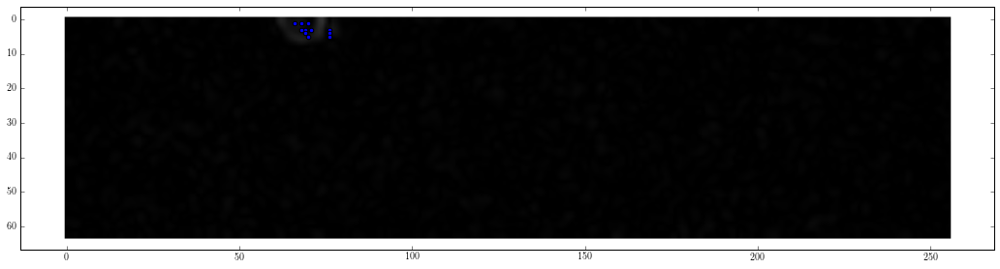

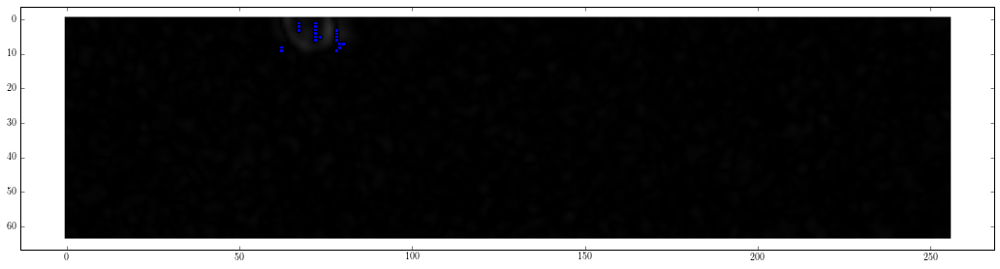

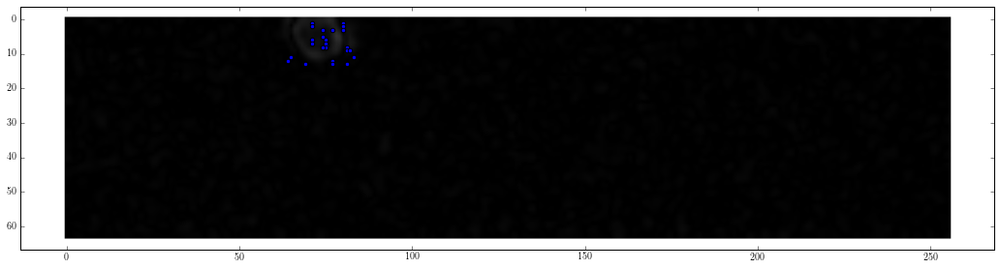

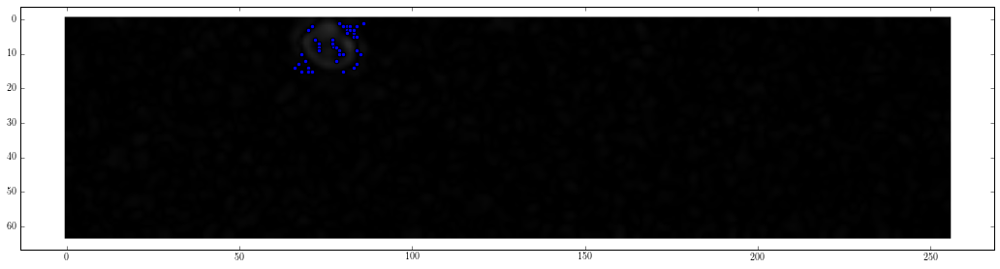

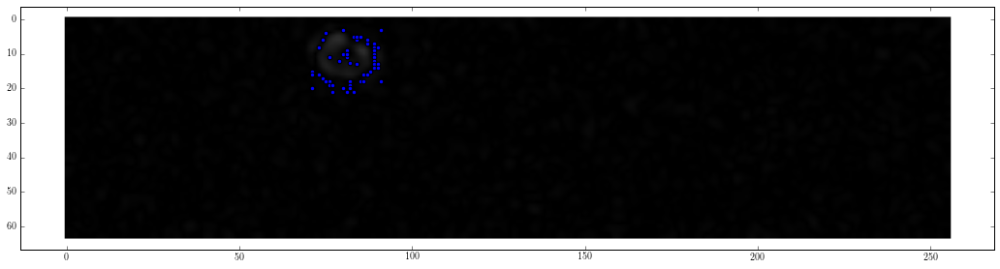

...

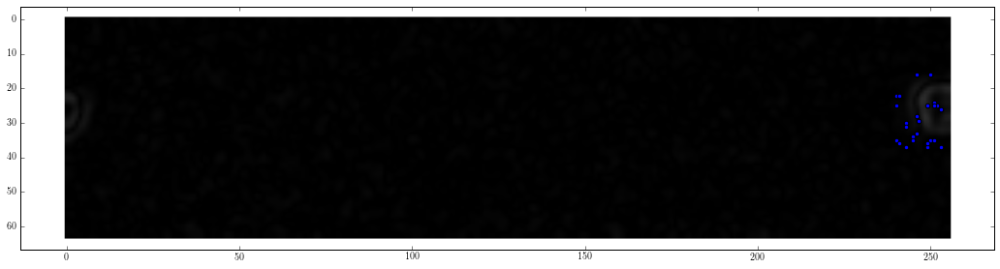

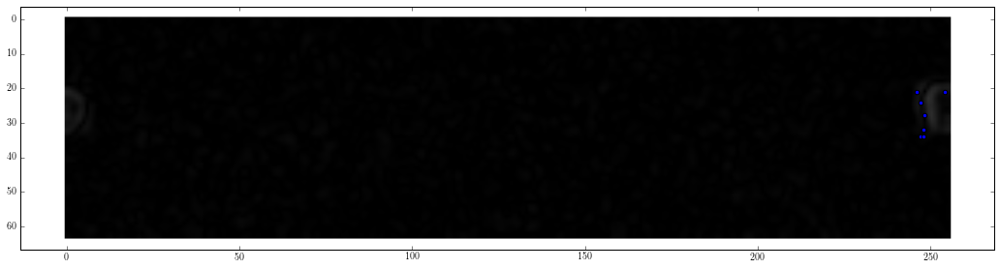

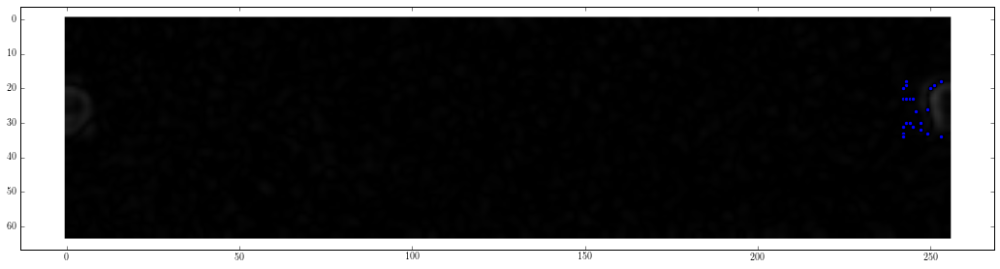

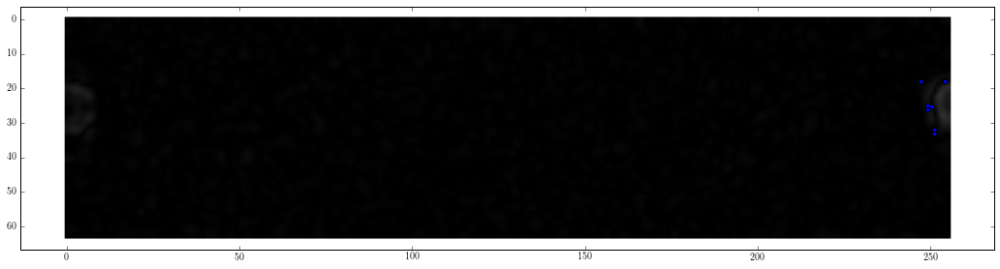

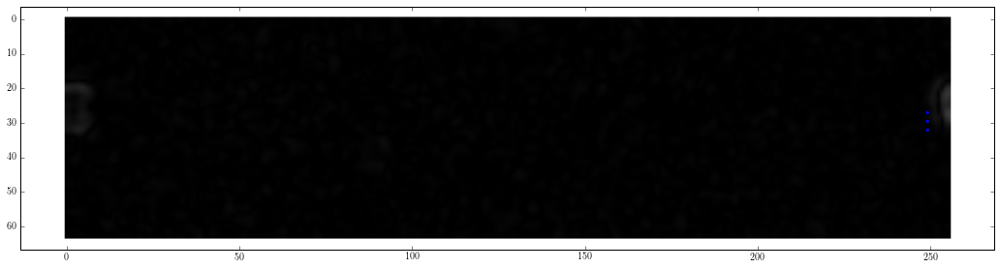

In [191]:
for i in range(len(frames)):
    index = i

    fig = plt.figure(figsize = (18, 12))
    plt.imshow(neg_frames[index], vmin = 0, vmax = 1, cmap = 'gray')
    try:
        plt.scatter(centroids[i][0], centroids[i][1])
        plt.scatter(boundaries[index][:,0], boundaries[index][:,1])
    except:
        pass
    plt.show()

# Remove outliers

In [ ]:
max_dist = 2
remove_list = []
for i in range(len(frames)):
    for j in range(boundaries[i].shape[0]):
        distances = ((boundaries[i][j,0]-boundaries[i][[k for k in range(boundaries[i].shape[0]) if k != j],0])**2.+\
        (boundaries[i][j,1]-boundaries[i][[k for k in range(boundaries[i].shape[0]) if k != j],1])**2.)**.5
        min_dist = np.min(distances)
        
        if min_dist > max_dist:
            remove_list.append(j)
            
    boundaries[i] = boundaries[i][[k for k in range(boundaries[i].shape[0]) if k not in remove_list],:]

# Plot radius vs theta

In [ ]:
for i in range(len(frames)):
    thetas = []
    rs = []
    for j in range(boundaries[i].shape[0]):
        dx = boundaries[i][j,0] - centroids[i][0]
        dy = boundaries[i][j,1] - centroids[i][1]
        theta = np.arctan2(dy, dx)
        if theta < 0:
            theta += 2*3.14159
        theta = theta*180/3.14159
        thetas.append(theta)
                
        rs.append((dx**2.+dy**2.)**.5)
        
    fig = plt.figure(figsize = (18,12))
    plt.imshow(frames[i], cmap = 'gray', vmin = 0, vmax = 1)
    plt.scatter(centroids[i][0], centroids[i][1])
    plt.scatter(boundaries[i][:,0], boundaries[i][:,1])
    plt.show()
    plt.scatter(thetas, rs)
    plt.ylim(0, max(rs))
    plt.xticks([0, 90, 180, 270, 360])
    plt.grid()
    plt.show()

# Plot aspect ratio

In [ ]:
aspects = []
for i in range(len(frames)):
    print np.max(boundaries[i][:,0]), np.min(boundaries[i][:,0]), np.max(boundaries[i][:,1]), np.min(boundaries[i][:,1])
    
    aspects.append(1.*(np.max(boundaries[i][:,0])-np.min(boundaries[i][:,0]))/(np.max(boundaries[i][:,1])-np.min(boundaries[i][:,1])))

In [ ]:
plt.scatter([i for i in range(len(aspects))], aspects)
plt.grid()
plt.show()

In [ ]:
for i, frame in enumerate(frames):
    plt.imshow(frame, cmap = 'gray', vmin = 0, vmax = 1, origin = 'lower')
    plt.xticks([])
    plt.yticks([])
    plt.savefig('/home/preston/Desktop/Science/Research/cancer_cells/nsf_proposal/cell_deformations/'+str(i)+'.png', dpi = 300)
    plt.show()

In [ ]:
print 56/64.
print 65/58.
print 65/61.
print 59/64.
print 59/56.
print 58/70.